In [1]:
import os

os.chdir("..")

In [2]:
import torch
from diffusers.pipelines import FluxPipeline
from PIL import Image

from omini.pipeline.flux_omini import Condition, generate, seed_everything

In [3]:
import os
os.environ["HF_HUB_VERBOSITY"] = "info"
os.environ["HF_HUB_DISABLE_PROGRESS_BARS"] = "0"
from transformers.utils import logging
logging.set_verbosity_info()
pipe = FluxPipeline.from_pretrained(
    "/home/xinrui/projects/OminiControl/ckpts/schnell", torch_dtype=torch.bfloat16
)
pipe = pipe.to("cuda")
pipe.load_lora_weights(
    "Yuanshi/OminiControl",
    weight_name=f"omini/subject_1024_beta.safetensors",
    adapter_name="subject",
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

loading file vocab.json
loading file merges.txt
loading file added_tokens.json
loading file special_tokens_map.json
loading file tokenizer_config.json
loading file tokenizer.json
loading file chat_template.jinja
ftfy or spacy is not installed using custom BasicTokenizer instead of ftfy.
loading configuration file /home/xinrui/projects/OminiControl/ckpts/schnell/text_encoder/config.json
Model config CLIPTextConfig {
  "architectures": [
    "CLIPTextModel"
  ],
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "dropout": 0.0,
  "eos_token_id": 2,
  "hidden_act": "quick_gelu",
  "hidden_size": 768,
  "initializer_factor": 1.0,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-05,
  "max_position_embeddings": 77,
  "model_type": "clip_text_model",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 1,
  "projection_dim": 768,
  "torch_dtype": "bfloat16",
  "transformers_version": "4.53.2",
  "vocab_size": 49408
}

loading weights file 

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

loading configuration file /home/xinrui/projects/OminiControl/ckpts/schnell/text_encoder_2/config.json
Model config T5Config {
  "architectures": [
    "T5EncoderModel"
  ],
  "classifier_dropout": 0.0,
  "d_ff": 10240,
  "d_kv": 64,
  "d_model": 4096,
  "decoder_start_token_id": 0,
  "dense_act_fn": "gelu_new",
  "dropout_rate": 0.1,
  "eos_token_id": 1,
  "feed_forward_proj": "gated-gelu",
  "initializer_factor": 1.0,
  "is_encoder_decoder": true,
  "is_gated_act": true,
  "layer_norm_epsilon": 1e-06,
  "model_type": "t5",
  "num_decoder_layers": 24,
  "num_heads": 64,
  "num_layers": 24,
  "output_past": true,
  "pad_token_id": 0,
  "relative_attention_max_distance": 128,
  "relative_attention_num_buckets": 32,
  "tie_word_embeddings": false,
  "torch_dtype": "bfloat16",
  "transformers_version": "4.53.2",
  "use_cache": true,
  "vocab_size": 32128
}

loading weights file /home/xinrui/projects/OminiControl/ckpts/schnell/text_encoder_2/model.safetensors.index.json
Instantiating T5Enc

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

All model checkpoint weights were used when initializing T5EncoderModel.

All the weights of T5EncoderModel were initialized from the model checkpoint at /home/xinrui/projects/OminiControl/ckpts/schnell/text_encoder_2.
If your task is similar to the task the model of the checkpoint was trained on, you can already use T5EncoderModel for predictions without further training.
loading file spiece.model
loading file tokenizer.json
loading file added_tokens.json
loading file special_tokens_map.json
loading file tokenizer_config.json
loading file chat_template.jinja
You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issue

100%|██████████| 8/8 [00:05<00:00,  1.36it/s]


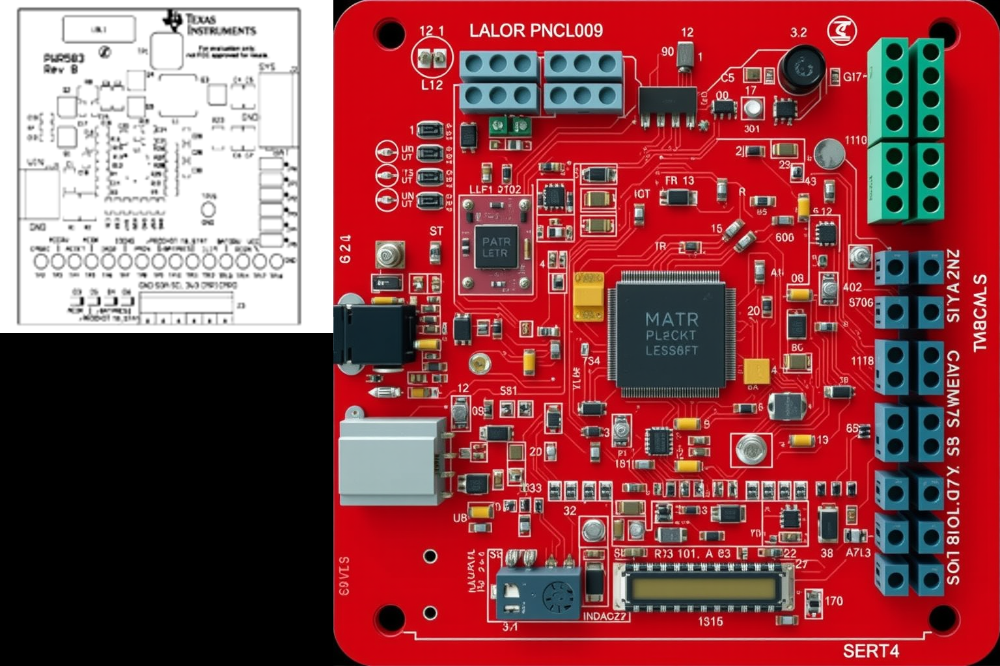

In [9]:
image = Image.open("assets/Picture1.png").convert("RGB").resize((512, 512))

# For this model, the position_delta is (0, -32).
# For more details of position_delta, please refer to:
# https://github.com/Yuanshi9815/OminiControl/issues/89#issuecomment-2827080344
condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "a top view PCB image in red with components according to the layout"


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

  0%|          | 0/8 [00:00<?, ?it/s]

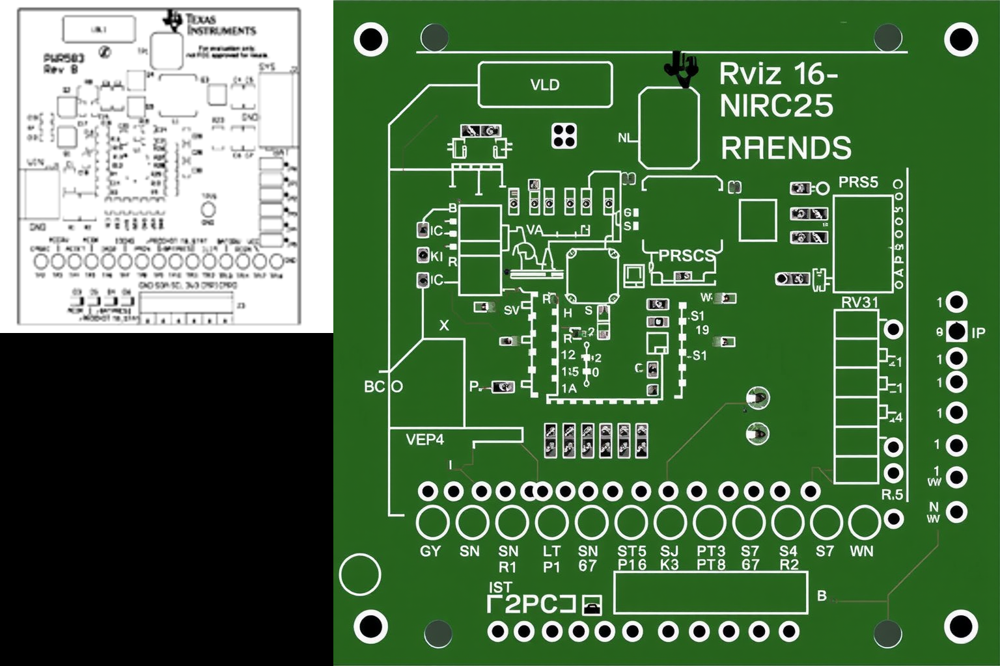

In [11]:
image = Image.open("assets/Picture1.png").convert("RGB").resize((512, 512))

# For this model, the position_delta is (0, -32).
# For more details of position_delta, please refer to:
# https://github.com/Yuanshi9815/OminiControl/issues/89#issuecomment-2827080344
condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "Generate a detailed, top view of a PCB image with a green solder-mask, strictly following the component placement in the subject image. Include all resistors, capacitors, and IC footprints positioned exactly as shown in the layout."


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

/home/xinrui/miniconda3/envs/pcbvar/lib/python3.12/site-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
100%|██████████| 8/8 [00:05<00:00,  1.35it/s]


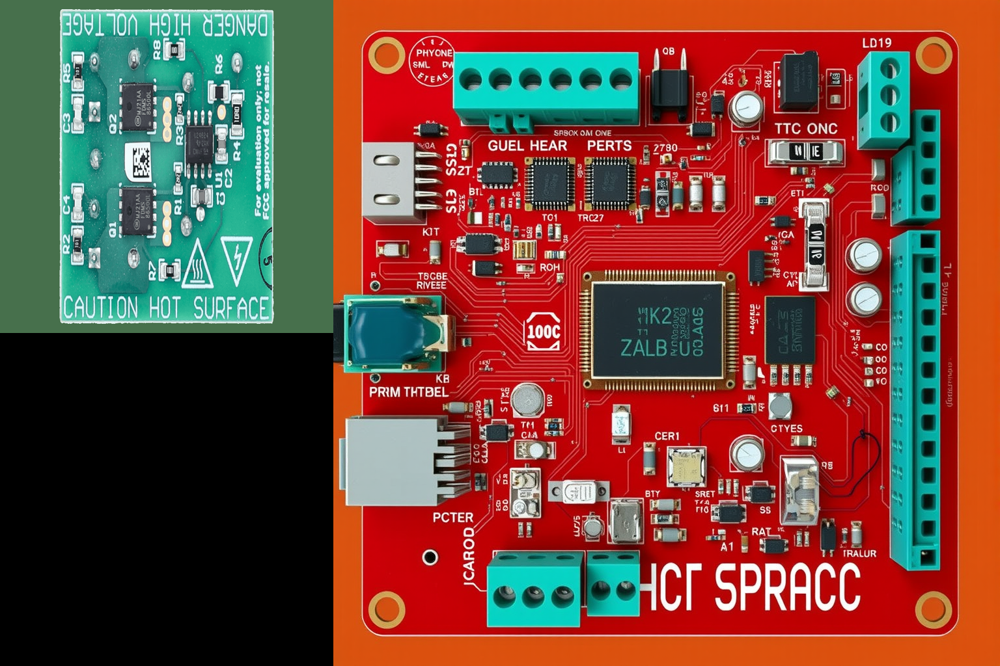

In [13]:
image = Image.open("assets/ucc24624evm-015-bottom.png").convert("RGB").resize((512, 512))

# For this model, the position_delta is (0, -32).
# For more details of position_delta, please refer to:
# https://github.com/Yuanshi9815/OminiControl/issues/89#issuecomment-2827080344
condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "a top view PCB image in red with components according to the layout"


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

/home/xinrui/miniconda3/envs/pcbvar/lib/python3.12/site-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
100%|██████████| 8/8 [00:05<00:00,  1.35it/s]


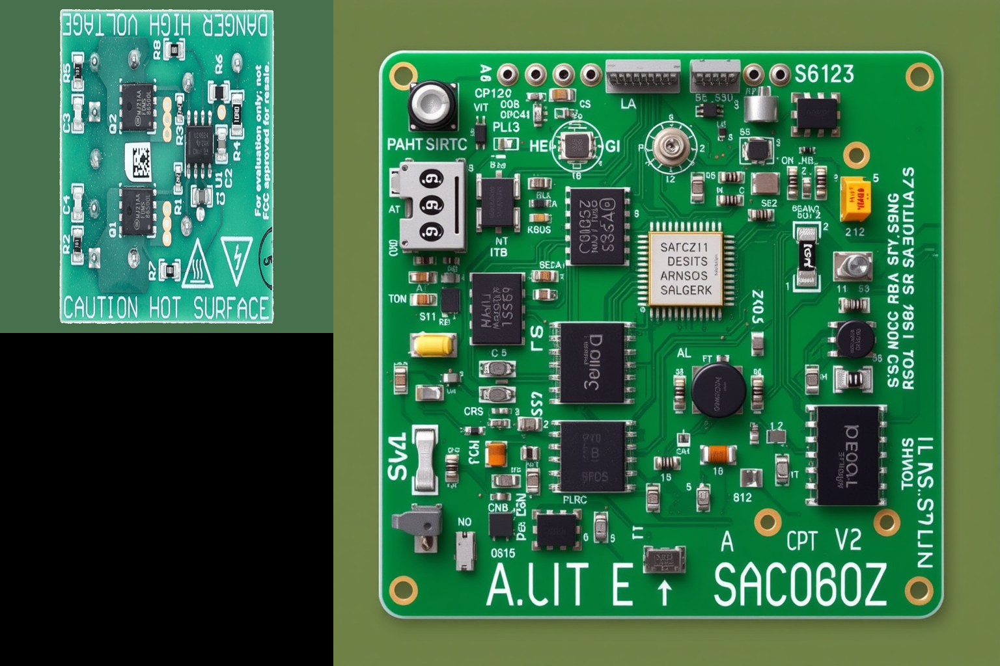

In [14]:
image = Image.open("assets/ucc24624evm-015-bottom.png").convert("RGB").resize((512, 512))

# For this model, the position_delta is (0, -32).
# For more details of position_delta, please refer to:
# https://github.com/Yuanshi9815/OminiControl/issues/89#issuecomment-2827080344
condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "a top view PCB image in green with components according to the layout"


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

100%|██████████| 8/8 [00:05<00:00,  1.36it/s]


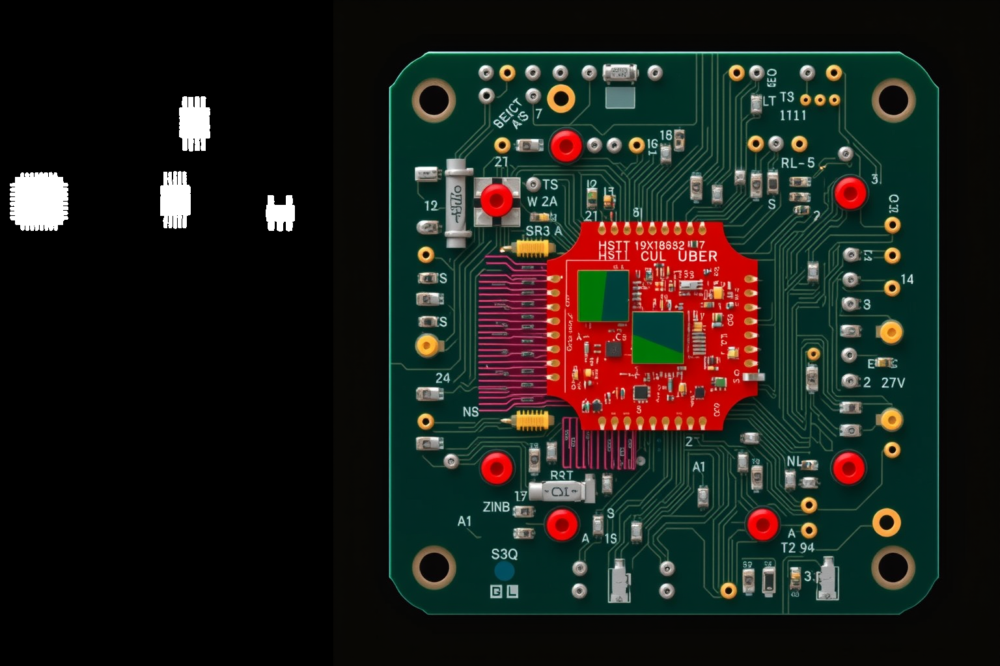

In [23]:
import numpy as np
image = Image.open("assets/ic_4.png").convert("RGB").resize((512, 512))
arr = np.array(image)
mask_bool = arr.max(axis=2, keepdims=True) > 0   # shape (512,512,1)
mask_3ch = np.broadcast_to(mask_bool, arr.shape).astype(np.uint8)  # shape (512,512,3)
mask_img = Image.fromarray(mask_3ch * 255, mode="RGB")
condition = Condition(mask_img, "subject", position_delta=(0, -32))

prompt = "a top view PCB image image been cropped in a small patch. The patch is in red with components according to the layout"


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(mask_img, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

100%|██████████| 8/8 [00:05<00:00,  1.35it/s]


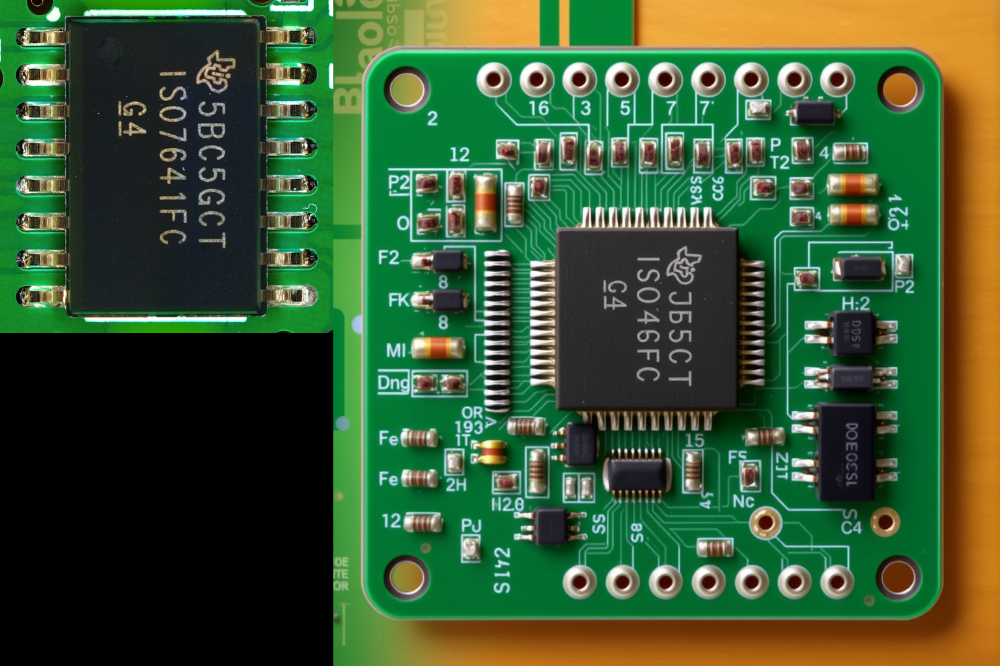

In [33]:
image = Image.open("assets/Card11_DAC8760EMCEVM_T_group_0_input.png").convert("RGB").resize((512, 512))

# For this model, the position_delta is (0, -32).
# For more details of position_delta, please refer to:
# https://github.com/Yuanshi9815/OminiControl/issues/89#issuecomment-2827080344
condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "a top view PCB image with this item on the board surrounding by some resistors, necessary ICs and capacitors. It has very clear trace, logo and logical layout of all the components. The PCB is in green color."


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

100%|██████████| 8/8 [00:05<00:00,  1.36it/s]


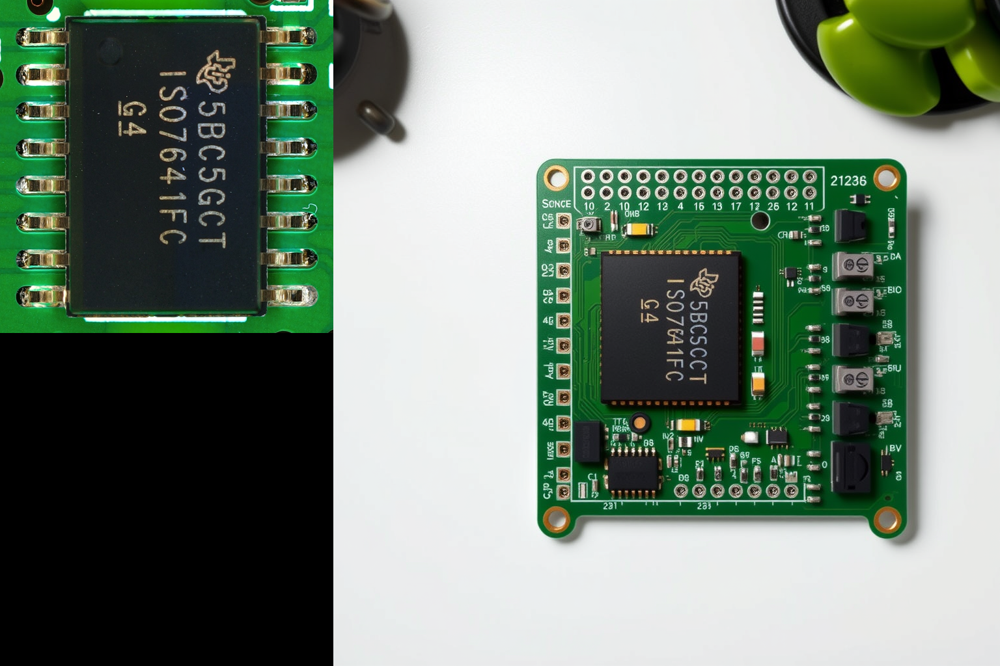

In [36]:
image = Image.open("assets/Card11_DAC8760EMCEVM_T_group_0_input.png").convert("RGB").resize((512, 512))

# For this model, the position_delta is (0, -32).
# For more details of position_delta, please refer to:
# https://github.com/Yuanshi9815/OminiControl/issues/89#issuecomment-2827080344
condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "a top view PCB image with only this item on the board. don't have any other components. The PCB is in green color and been put on a white table."


seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

  0%|          | 0/8 [00:00<?, ?it/s]

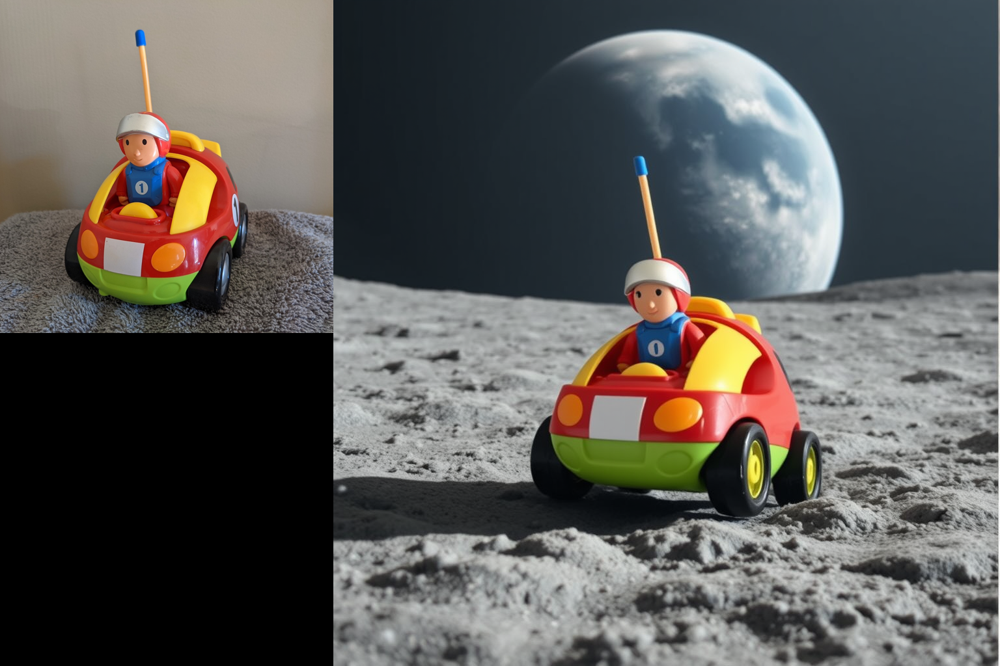

In [10]:
image = Image.open("assets/rc_car.jpg").convert("RGB").resize((512, 512))

condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "A film style shot. On the moon, this item drives across the moon surface. The background is that Earth looms large in the foreground."

seed_everything()

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

In [ ]:
image = Image.open("assets/clock.jpg").convert("RGB").resize((512, 512))

condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "In a Bauhaus style room, this item is placed on a shiny glass table, with a vase of flowers next to it. In the afternoon sun, the shadows of the blinds are cast on the wall."

seed_everything(0)

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image

In [ ]:
image = Image.open("assets/oranges.jpg").convert("RGB").resize((512, 512))

condition = Condition(image, "subject", position_delta=(0, -32))

prompt = "A very close up view of this item. It is placed on a wooden table. The background is a dark room, the TV is on, and the screen is showing a cooking show."

seed_everything()

result_img = generate(
    pipe,
    prompt=prompt,
    conditions=[condition],
    num_inference_steps=8,
    height=1024,
    width=1024,
).images[0]

concat_image = Image.new("RGB", (1024 + 512, 1024))
concat_image.paste(image, (0, 0))
concat_image.paste(result_img, (512, 0))
concat_image